In [3]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import torch
import random
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import functions as f
import gseapy
from matplotlib import rcParams
from IPython.display import clear_output

%matplotlib inline
scvi.settings.seed = 0
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)

sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")
torch.cuda.empty_cache()
clear_output()

In [4]:
# Filter Data
gex_h5_path = '/home/ehb/Desktop/scRNA_analysis/CellRanger_and_VCF_Data/GEX/filtered_feature_bc_matrix.h5'
gex_demux_path = '/home/ehb/Desktop/scRNA_analysis/CellRanger_and_VCF_Data/GEX/gex.best'

filtered_gex_adata = f.load_and_filter_data(gex_h5_path, gex_demux_path)


/home/ehb/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ehb/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ehb/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Raw cell counts: 59614 | Raw gene counts: 38606
Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.55
Detected doublet rate = 1.1%
Estimated detectable doublet fraction = 46.6%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.4%
Elapsed time: 46.0 seconds
Filtered cell counts: 35009 | Filtered gene counts: 21376


In [ ]:
for symbol in filtered_gex_adata.var['gene_ids']:
    if symbol == 'PTPRC':
        print('found')
        break


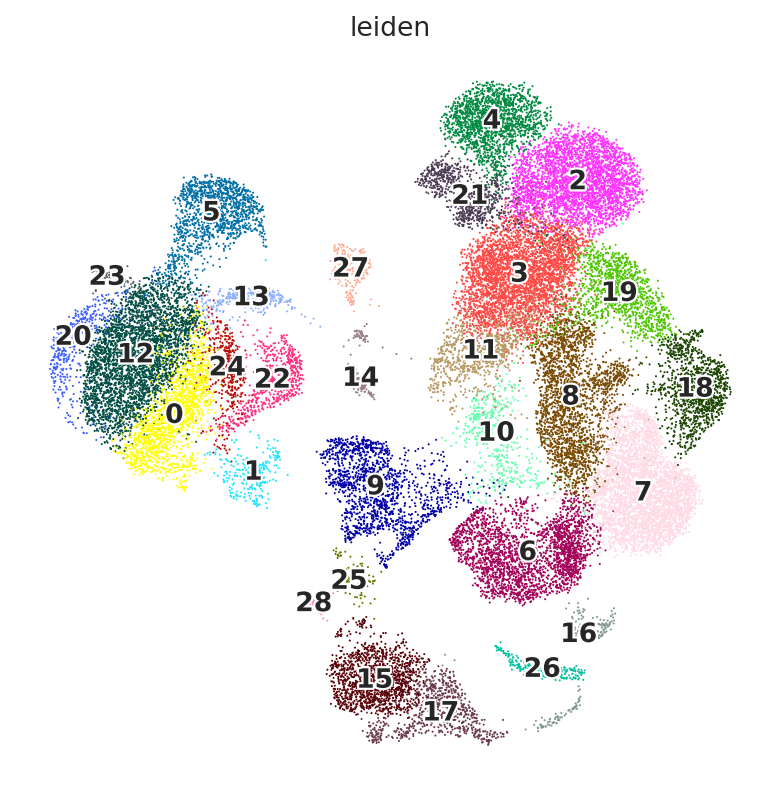

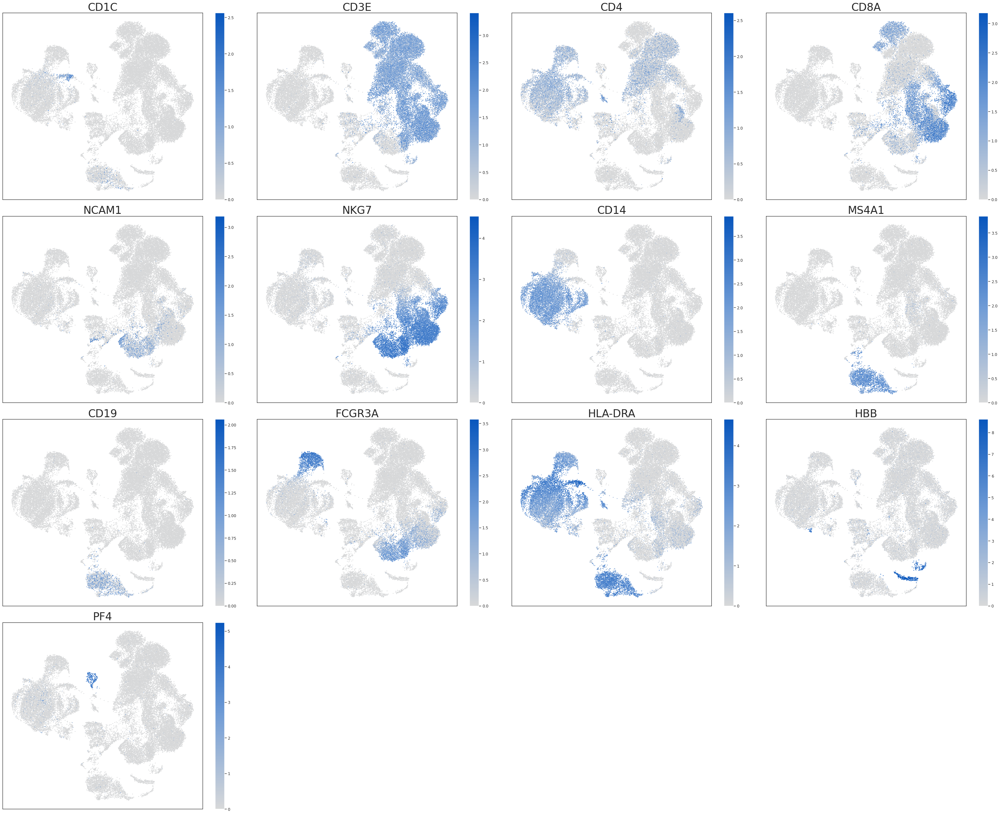

In [5]:
# Major cell type clustering and gene expression plot

filtered_gex_adata = f.leiden_and_umap(filtered_gex_adata, pca_n_comps=30, leiden_res=1)

f.plot_multiple_gene_expression_umap(
    filtered_gex_adata,
    gene_symbols=['CD1C', 'CD3E', 'CD4', 'CD8A', 'NCAM1', 'NKG7', 'CD14', 'MS4A1', 'CD19', 'FCGR3A', 'HLA-DRA', 'HBB', 'PF4'],
)


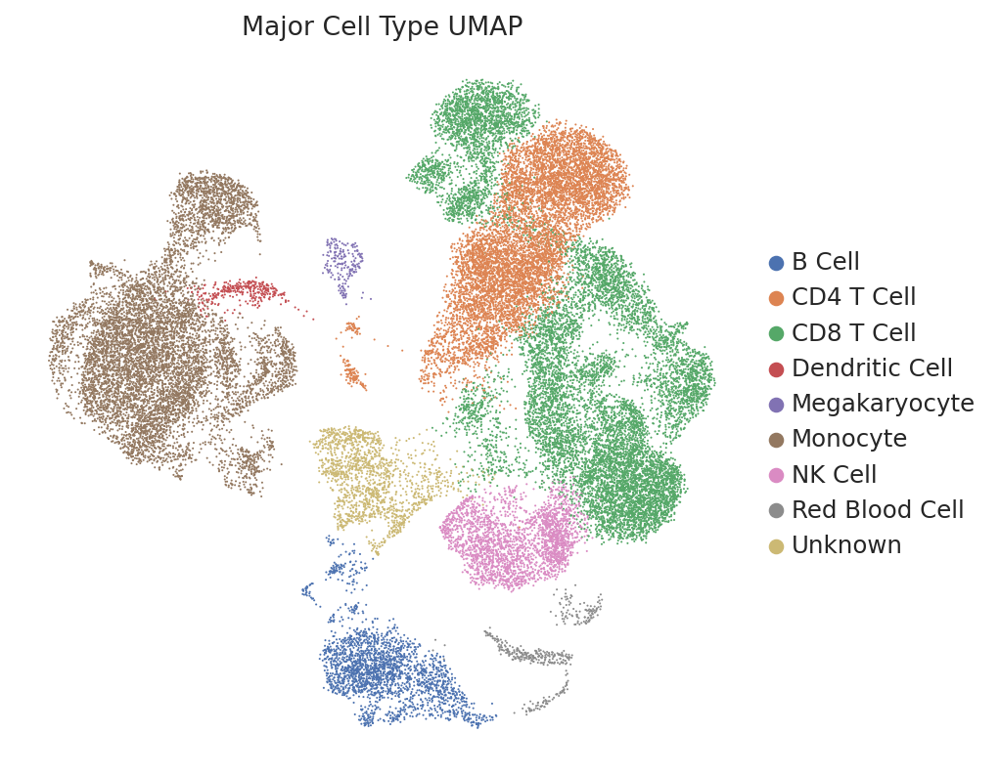

In [6]:
# Assign major cell type

major_celltype_leiden_idx_annotation = {
    '0': 'Monocyte',
    '1': 'Monocyte',
    '2': 'CD4 T Cell',
    '3': 'CD4 T Cell',
    '4': 'CD8 T Cell',
    '5': 'Monocyte',
    '6': 'NK Cell',
    '7': 'CD8 T Cell',
    '8': 'CD8 T Cell',
    '9': 'Unknown',
    '10': 'CD8 T Cell',
    '11': 'CD4 T Cell',
    '12': 'Monocyte',
    '13': 'Dendritic Cell',
    '14': 'CD4 T Cell',
    '15': 'B Cell',
    '16': 'Red Blood Cell',
    '17': 'B Cell',
    '18': 'CD8 T Cell',
    '19': 'CD8 T Cell',
    '20': 'Monocyte',
    '21': 'CD8 T Cell',
    '22': 'Monocyte',
    '23': 'Monocyte',
    '24': 'Monocyte',
    '25': 'B Cell',
    '26': 'Red Blood Cell',
    '27': 'Megakaryocyte',
    '28': 'B Cell',
}
filtered_gex_adata.obs['celltype'] = filtered_gex_adata.obs['leiden'].map(major_celltype_leiden_idx_annotation)
sc.pl.umap(filtered_gex_adata, color='celltype', title='Major Cell Type UMAP')

In [ ]:
# CD4 T subtype annotation

adata = filtered_gex_adata.copy()
CD4T_adata = adata[adata.obs['celltype'] == 'CD4 T Cell', :]
CD4T_adata = f.leiden_and_umap(CD4T_adata, pca_n_comps=30, leiden_res=0.5)

f.plot_multiple_gene_expression_umap(
    CD4T_adata,
    # gene_symbols=['CCR4', 'CCR6', 'CCR7', 'PTPRC', 'FOXP3', 'CD27', 'CD28', 'CD69', 'AQP3', 'PDCD1'],
    gene_symbols=['CCR4', 'CCR6', 'CXCR3', 'CXCR5'],  # function
    n_cols=2,
)

CD4T_leiden_idx_annotation = {
    '0': 'Naive-like T Cell',
    '1': 'Effector Memory T Cell',
    '2': 'Naive-like T Cell',
    '3': 'Treg',
    '4': 'T exhaustion ???',
    '5': 'Effector Memory T Cell',
    '6': 'Naive-like T Cell',
    '7': 'Naive-like T Cell',
    '8': 'Unknown',
}
CD4T_adata.obs['celltype'] = CD4T_adata.obs['leiden'].map(CD4T_leiden_idx_annotation)
sc.pl.umap(CD4T_adata, color='celltype')


In [ ]:
# CD8 T subtype annotation

adata = filtered_gex_adata.copy()
CD8T_adata = adata[adata.obs['celltype'] == 'CD8 T Cell', :]
CD8T_adata = f.leiden_and_umap(CD8T_adata, pca_n_comps=30, leiden_res=0.5)

f.plot_multiple_gene_expression_umap(
    CD8T_adata,
    gene_symbols=['CCR4', 'CCR6', 'CCR7', 'CXCR3', 'PTPRC', 'FOXP3', 'CD27', 'CD28', 'CD69', 'AQP3', 'PDCD1'],
)

CD8T_leiden_idx_annotation = {
    '0': '',
    '1': '',
    '2': '',
    '3': '',
    '4': '',
    '5': '',
}
CD8T_adata.obs['celltype'] = CD8T_adata.obs['leiden'].map(CD8T_leiden_idx_annotation)
sc.pl.umap(CD8T_adata, color='celltype')


In [ ]:
# DEG analysis

# Select the cell type to run DEG
adata = filtered_gex_adata.copy()
# adata = adata[adata.obs['coarse_cell_type'] == 'T cell', :]


# Non-meaningful genes to be removed from plotting
blacklist_genes = ['LINC02109', 'LINC00540', 'LINC01765', 'LINC03078', 'LINC00200', 'LINC00910', 'C1orf162', 'LINC01505', 'LINC00944', 
                   'LINC02762', 'C20orf204', 'LINC00540', 'LINC02446', 'LINC02694', 'LINC00892', 'LINC01619']


# Run DEG
cell_type_list = adata.obs['celltype'].unique()  # get the list of unique cell types
for selected_cell_type in cell_type_list:
    adata_celltype = adata[adata.obs['celltype'] == selected_cell_type].copy()
    print(selected_cell_type,f'; Number of cells: {adata_celltype.n_obs}')
    adata_with_deg_results = f.run_DEG_by_phenotype(adata_celltype)

    # export DEG as csv
    _export_dir = '/home/ehb/Desktop/scRNA_analysis/results/DEG_major_celltype/'
    adata_with_deg_results.uns['deg_results'].sort_values(
        by='logfoldchanges',
        ascending=False
    ).to_csv(f'{_export_dir}DEG_{selected_cell_type}.csv', index=False)

    f.plot_DEG_results(
        adata_with_deg_results,
        n_top_genes=15,
        dot_plot_title=f'Top DE genes of {selected_cell_type} in the DLco<LLN group',
        blacklist_genes=blacklist_genes
    )
    print('--------------------------------------------------------------------------------------------------')



In [ ]:
# GSEA

def run_gsea(adata, gene_set_name, out_path):
    dense_adata_T = adata.X.T.toarray() # transpose then convert from sparse to dense matrix
    expression_dataframe = pd.DataFrame(dense_adata_T, index=adata.var['gene_ids'], columns=adata.obs_names)  # use gene id as index
    phenotypes = adata.obs['phenotype'].tolist()
    gseapy.gsea(
        data=expression_dataframe, 
        gene_sets=gene_set_name, 
        cls=phenotypes, 
        pheno_pos='abnormal',
        pheno_neg='normal',
        outdir=out_path,
        permutation_type='gene_set',
        threads=16,
    )


def run_gsea_for_all_celltype(input_adata):
    adata = input_adata.copy()
    cell_types = adata.obs['celltype'].unique()
    for ct in cell_types:
        adata_ct = adata[adata.obs['celltype'] == ct].copy()
        gene_set_list = [
            'GO_Biological_Process_2023',
            'GO_Cellular_Component_2023',
            'GO_Molecular_Function_2023',
            'MSigDB_Hallmark_2020',
            'KEGG_2021_Human',
            'Reactome_2022',
            'WikiPathway_2023_Human',
            'HDSigDB_Human_2021',
        ]

        for gene_set in gene_set_list: # run different gene sets for each cell type
            gsea_results_path = f'/home/ehb/Desktop/scRNA_analysis/results/GSEA_major_celltype/{ct}/{gene_set}/'
            try:
                run_gsea(adata_ct, gene_set, gsea_results_path)
            except:
                pass
            clear_output()


run_gsea_for_all_celltype(filtered_gex_adata)



In [ ]:
# Pseudotime & Trajectory Inference

def pseudotime_trajectory_analysis(adata):
    # sc.pp.neighbors(adata)
    # sc.tl.diffmap(adata) # denoising by recomputing neighbors with diffmap
    # sc.pp.neighbors(adata, n_neighbors=15, use_rep="X_diffmap")
    # sc.tl.leiden(adata, resolution=0.2, flavor='igraph', n_iterations=2)
    
    sc.tl.paga(adata, groups="leiden")
    sc.pl.paga(adata) # this func must be called to create params

    sc.tl.draw_graph(adata, init_pos="paga")
    sc.pl.draw_graph(adata, color=["leiden", "phenotype"], legend_loc="on data")
    sc.pl.paga_compare(adata, threshold=0.03, edge_width_scale=0.6, legend_fontsize=12, fontsize=12, edges=True)

    _root_cluster_name = '2'
    adata.uns['iroot'] = np.flatnonzero(adata.obs['leiden'] == _root_cluster_name)[0]
    sc.tl.dpt(adata) # pseudotime inference

    sc.pl.draw_graph(adata, color='celltype')
    sc.pl.draw_graph(adata, color='phenotype')
    sc.pl.draw_graph(adata, color='patient_id')
    sc.pl.draw_graph(adata, color='dpt_pseudotime')


    # add paga gene reconstruction if found something interesting


pseudotime_trajectory_analysis(adata.copy())





In [16]:
# FB analysis functions

def load_FB_data(h5_file_path):
    # Load aggregated h5 data and process cell barcode suffix
    adata = sc.read_10x_h5(h5_file_path)
    adata.obs.index = adata.obs.index.str.replace('-2$', '-1', regex=True) # change second set of barcode with suffix -1
    adata = adata[~adata.obs.index.duplicated(keep='last')]
    assert not adata.obs.index.duplicated().any() # assert no duplicate barcodes

    # swap var_name with gene_ids column such that, ensembl id is used as var_name, and mixed gene id is under gene_ids
    _adata = adata.copy()
    _adata.var_names_make_unique()  # remove duplicates in the mixed gene id column first
    _converted_gene_id_array = _adata.var_names
    _raw_ensembl_id_array = _adata.var['gene_ids'].values
    _adata.var_names = _raw_ensembl_id_array
    _adata.var['gene_ids'] = _converted_gene_id_array
    adata = _adata
    adata.var_names_make_unique()  # remove duplicates in ensembl id
    print(f"Raw cell counts: {adata.n_obs} | Raw gene counts: {adata.n_vars}")
    # sc.pp.normalize_total(adata)
    # sc.pp.log1p(adata)
    return adata

In [17]:
# FB GEX analysis

fb_h5_path = '/home/ehb/Desktop/scRNA_analysis/CellRanger_and_VCF_Data/FB/filtered_feature_bc_matrix.h5'
fb_adata = load_FB_data(fb_h5_path)


# Find overlapping cells and create new adata with only overlapped cells
overlapping_cell_barcodes = filtered_gex_adata.obs_names.intersection(fb_adata.obs_names)

overlap_gex_adata = filtered_gex_adata[overlapping_cell_barcodes].copy()
overlap_fb_adata = fb_adata[overlapping_cell_barcodes].copy()
overlap_fb_adata = overlap_fb_adata[:, overlap_gex_adata.var_names].copy()  # subset fb adata's genes to match with gex adata



Raw cell counts: 40588 | Raw gene counts: 38606


/home/ehb/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ehb/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/ehb/anaconda3/envs/scrna/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


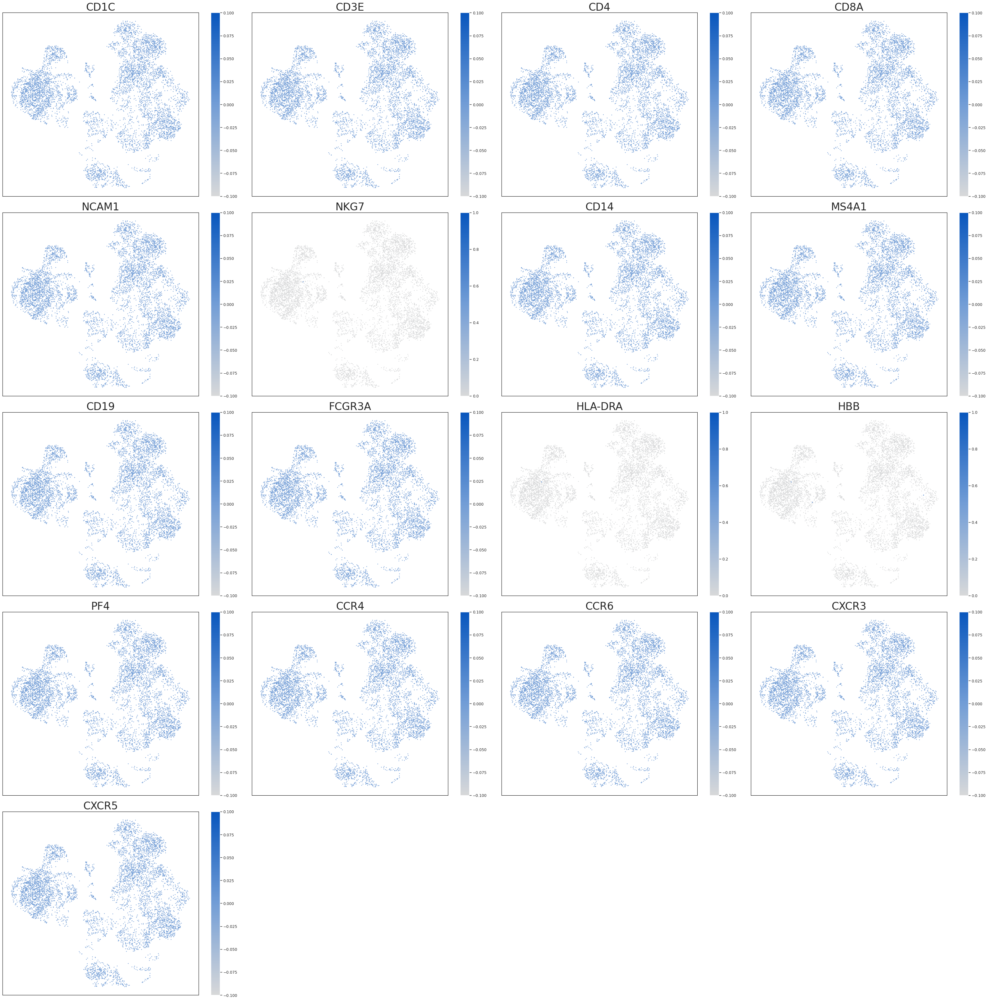

In [18]:
import matplotlib.colors as colors

def plot_multiple_gene_expression_umap(adata, adata2, gene_symbols: list, n_cols: int = 4):
    # Calculate number of rows needed
    n_rows = int(np.ceil(len(gene_symbols) / n_cols))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(10 * n_cols, 8 * n_rows), dpi=40)
    cmap = colors.LinearSegmentedColormap.from_list("custom", ['#d7d8d9', '#729dd6', '#0856bd'], N=256)
    
    # Plot each gene
    for idx, gene_symbol in enumerate(gene_symbols):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        
        # Get expression values
        expression_values = adata2[:, adata2.var['gene_ids']==gene_symbol].X.toarray().squeeze()
        
        # Create scatter plot
        ax.set_facecolor('white')
        scatter = ax.scatter(
            adata.obsm['X_umap'][:, 0],
            adata.obsm['X_umap'][:, 1],
            c=expression_values,
            cmap=cmap,
            s=1.4
        )
        
        # Customize appearance
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['top'].set_visible(True)
        ax.spines['right'].set_visible(True)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)
        for spine in ax.spines.values():
            spine.set_color('black')
            spine.set_linewidth(1.0)
        
        plt.colorbar(scatter, ax=ax)
        ax.set_title(f'{gene_symbol}', fontsize=30)

    # Hide empty subplots
    for idx in range(len(gene_symbols), n_rows * n_cols):
        row = idx // n_cols
        col = idx % n_cols
        axes[row, col].set_visible(False)
    
    plt.tight_layout()
    plt.show()



plot_multiple_gene_expression_umap(
    overlap_gex_adata,
    overlap_fb_adata,
    gene_symbols=['CD1C', 'CD3E', 'CD4', 'CD8A', 'NCAM1', 'NKG7', 'CD14', 'MS4A1', 'CD19', 'FCGR3A', 'HLA-DRA', 'HBB', 'PF4', 'CCR4', 'CCR6', 'CXCR3', 'CXCR5']
)

0


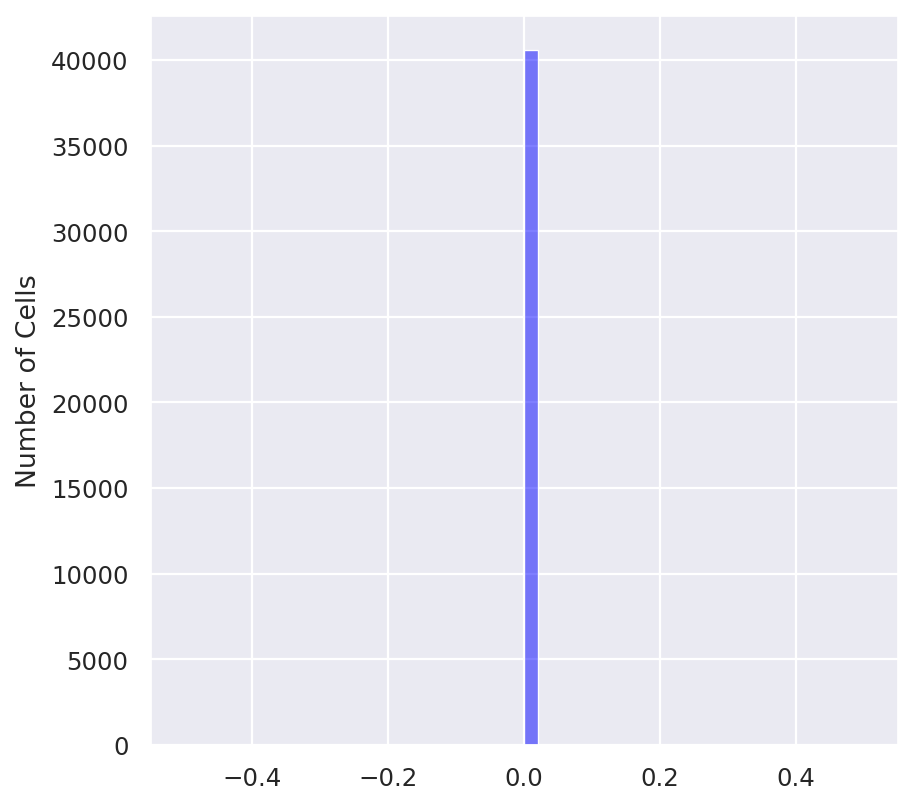

In [ ]:


test_adata = fb_adata.copy()

expression_values = test_adata[:, test_adata.var['gene_ids']=='CD4'].X.toarray().squeeze()

sns.histplot(expression_values, bins=50, kde=True, color='blue')
plt.ylabel('Number of Cells')
plt.show()